In [1]:
import torch
from utils import *
from PIL import Image, ImageDraw, ImageFont, ImageFilter
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as compare_ssim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [2]:
device

device(type='cuda')

# SRRESNET Run:  
https://wandb.ai/samad037-university-of-minnesota/SRResnet-training/runs/r62n8ebs
# SRGAN Run:
https://wandb.ai/samad037-university-of-minnesota/SRGAN-training?nw=nwusersamad037

In [3]:
# Model checkpoints
srgan_checkpoint = "./checkpoint_srgan.pth.tar"
srresnet_checkpoint = "./checkpoint_srresnet.pth.tar"

# Load models
srresnet = torch.load(srresnet_checkpoint, weights_only=False)['model'].to(device)
srresnet.eval()
srgan_generator = torch.load(srgan_checkpoint, weights_only=False)['generator'].to(device)
srgan_generator.eval()

print("Model in eval mode")

Model in eval mode


In [4]:
checkpoint_srgan = torch.load(srgan_checkpoint, weights_only=False)
start_epoch = checkpoint_srgan['epoch'] + 1
print(f"epoch: {start_epoch}")

epoch: 301


In [5]:
def calculate_psnr(img1, img2):
    """
    Calculates PSNR (Peak Signal-to-Noise Ratio) between two images.
    Assumes img1 and img2 are PIL images with the same dimensions.
    
    :param img1: PIL Image
    :param img2: PIL Image
    :return: PSNR value
    """
    # Convert images to numpy arrays
    img1 = np.array(img1).astype(np.float32)
    img2 = np.array(img2).astype(np.float32)
    
    # Calculate Mean Squared Error (MSE)
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    
    # Calculate PSNR
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

In [6]:
def calculate_ssim(img1, img2):
    """
    Calculate SSIM between two images.

    :param img1: First image (PIL Image).
    :param img2: Second image (PIL Image).
    :return: SSIM value.
    """
    img1 = np.array(img1)
    img2 = np.array(img2)
    # Ensure the images are of the same dimensions
    if img1.shape != img2.shape:
        raise ValueError("Input images must have the same dimensions for SSIM calculation.")

    # Dynamically determine the window size
    win_size = min(7, img1.shape[0], img1.shape[1])  # Choose 7 or smaller dimensions
    if win_size < 3:
        win_size = 3  # Set to the smallest odd value
    
    # Check if the images are multichannel
    channel_axis = -1 if len(img1.shape) == 3 else None

    # Calculate SSIM
    ssim_value, _ = compare_ssim(
        img1, img2, full=True, channel_axis=channel_axis, win_size=win_size
    )
    return ssim_value

In [32]:
def visualize_sr_plot(img_path, halve=False):
    """
    Visualizes the super-resolved images from SRResNet and SRGAN for comparison
    with the bicubic-upsampled image and the original high-resolution (HR) image.

    :param img_path: File path of the HR image.
    :param halve: Whether to halve the HR image dimensions for visualization.
    """
    # Load HR image
    hr_img = Image.open(img_path).convert('RGB')
    if halve:
        hr_img = hr_img.resize((hr_img.width // 2, hr_img.height // 2), Image.LANCZOS)
    
    # Generate low-resolution (LR) image
    #lr_img = hr_img.resize((hr_img.width // 4, hr_img.height // 4), Image.BICUBIC)
    blurred_img = hr_img.filter(ImageFilter.GaussianBlur(radius=1))
    lr_img = blurred_img.resize((hr_img.width // 4, hr_img.height // 4), Image.BOX)

    # Super-resolution (SR) with SRResNet
    sr_img_srresnet = srresnet(convert_image(lr_img, source='pil', target='imagenet-norm').unsqueeze(0).to(device))
    sr_img_srresnet = sr_img_srresnet.squeeze(0).cpu().detach()
    sr_img_srresnet = convert_image(sr_img_srresnet, source='[-1, 1]', target='pil')

    # Super-resolution (SR) with SRGAN
    sr_img_srgan = srgan_generator(convert_image(lr_img, source='pil', target='imagenet-norm').unsqueeze(0).to(device))
    sr_img_srgan = sr_img_srgan.squeeze(0).cpu().detach()
    sr_img_srgan = convert_image(sr_img_srgan, source='[-1, 1]', target='pil')

    # Bicubic upsampling
    bicubic_img = lr_img.resize((sr_img_srgan.width, sr_img_srgan.height), Image.BICUBIC)

    # nn-upsampling
    nearest_img = lr_img.resize((sr_img_srgan.width, sr_img_srgan.height), Image.NEAREST)
    
    # Calculate PSNR for SRGAN and SRRESNET
    hr_img = hr_img.resize((sr_img_srgan.width, sr_img_srgan.height), Image.LANCZOS)
    psnr_bicubic = calculate_psnr(bicubic_img, hr_img)
    psnr_nearest = calculate_psnr(nearest_img, hr_img)
    #psnr_srresnet = calculate_psnr(sr_img_srresnet, hr_img)
    psnr_srgan = calculate_psnr(sr_img_srgan, hr_img)
    

    # calculate SSIM
    ssim_bicubic = calculate_ssim(bicubic_img, hr_img)
    ssim_nearest = calculate_ssim(nearest_img, hr_img)
    ssim_srresnet = calculate_ssim(sr_img_srresnet, hr_img)
    ssim_srgan = calculate_ssim(sr_img_srgan, hr_img)

    # Set up the Matplotlib figure and axes (3 rows x 2 columns)
    fig, axs = plt.subplots(3, 2, figsize=(14, 18))
    fig.suptitle("PSNR and SSIM Comparison with SRGAN, SRResNet and Bicubic", fontsize=16)

    # LR image
    axs[0, 0].imshow(lr_img)
    axs[0, 0].set_title(f"Original LR Image: {lr_img.size}")
    #axs[0, 0].axis("off")
    
    # HR image
    axs[0, 1].imshow(hr_img)
    axs[0, 1].set_title(f"Ground Truth HR: {hr_img.size}")
    #axs[0, 1].axis("off")
    
    # SRResNet image
    # axs[1, 0].imshow(sr_img_srresnet)
    # axs[1, 0].set_title(f"SRResNet\nPSNR: {psnr_srresnet:.2f} dB | SSIM: {ssim_srresnet:.3f}")
    #axs[1, 0].axis("off")
    
    # SRGAN image
    axs[1, 0].imshow(sr_img_srgan)
    axs[1, 0].set_title(f"SRGAN\nPSNR: {psnr_srgan:.2f} dB | SSIM: {ssim_srgan:.3f}")
    #axs[1, 1].axis("off")
    
    # Bicubic image
    axs[1, 1].imshow(bicubic_img)
    axs[1, 1].set_title(f"Bicubic\nPSNR: {psnr_bicubic:.2f} dB | SSIM: {ssim_bicubic:.3f}")
    #axs[1, 1].axis("off")

    axs[2, 0].imshow(nearest_img)
    axs[2, 0].set_title(f"Nearest neighbour \nPSNR: {psnr_nearest:.2f} dB | SSIM: {ssim_nearest:.3f}")
    #axs[2, 0].axis("off")
    
    # Empty plot (optional placeholder)
    axs[2, 1].axis("off")
    
    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return fig

In [8]:
def compare_zoomed_region(img_path, region, halve=False):
    """
    Compares PSNR and SSIM for a specific zoomed-in region of an image across
    bicubic-upsampled, SRResNet, and SRGAN outputs.

    :param img_path: File path of the HR image.
    :param region: Tuple (x, y, width, height) specifying the zoomed-in region.
    :param halve: Whether to halve the HR image dimensions for visualization.
    """
    # Load HR image
    hr_img = Image.open(img_path).convert('RGB')
    if halve:
        hr_img = hr_img.resize((hr_img.width // 2, hr_img.height // 2), Image.LANCZOS)
    
    # Generate low-resolution (LR) image
    blurred_img = hr_img.filter(ImageFilter.GaussianBlur(radius=1))
    lr_img = blurred_img.resize((hr_img.width // 4, hr_img.height // 4), Image.BOX)

    # Super-resolution (SR) with SRResNet
    sr_img_srresnet = srresnet(convert_image(lr_img, source='pil', target='imagenet-norm').unsqueeze(0).to(device))
    sr_img_srresnet = sr_img_srresnet.squeeze(0).cpu().detach()
    sr_img_srresnet = convert_image(sr_img_srresnet, source='[-1, 1]', target='pil')

    # Super-resolution (SR) with SRGAN
    sr_img_srgan = srgan_generator(convert_image(lr_img, source='pil', target='imagenet-norm').unsqueeze(0).to(device))
    sr_img_srgan = sr_img_srgan.squeeze(0).cpu().detach()
    sr_img_srgan = convert_image(sr_img_srgan, source='[-1, 1]', target='pil')

    # Bicubic upsampling
    bicubic_img = lr_img.resize((hr_img.width, hr_img.height), Image.BICUBIC)

    # nn-upsampling
    nearest_img = lr_img.resize((hr_img.width, hr_img.height), Image.NEAREST)
    
    # Resize all images to the HR image dimensions
    #hr_img = hr_img.resize((sr_img_srgan.width, srgan_region.height), Image.LANCZOS)

    # Extract zoomed-in region for all images
    x, y, width, height = region
    hr_region = hr_img.crop((x, y, x + width, y + height))
    lr_region = lr_img.resize((hr_img.width, hr_img.height), Image.BOX).crop((x, y, x + width, y + height))
    srresnet_region = sr_img_srresnet.crop((x, y, x + width, y + height))
    srgan_region = sr_img_srgan.crop((x, y, x + width, y + height))
    bicubic_region = bicubic_img.crop((x, y, x + width, y + height))
    nearest_region = nearest_img.crop((x, y, x + width, y + height))
    
    # Calculate PSNR and SSIM for the zoomed-in region
    psnr_bicubic = calculate_psnr(bicubic_region, hr_region)
    psnr_nearest = calculate_psnr(nearest_region, hr_region)
    psnr_srresnet = calculate_psnr(srresnet_region, hr_region)
    psnr_srgan = calculate_psnr(srgan_region, hr_region)

    ssim_bicubic = calculate_ssim(bicubic_region, hr_region)
    ssim_nearest = calculate_ssim(nearest_region, hr_region)
    ssim_srresnet = calculate_ssim(srresnet_region, hr_region)
    ssim_srgan = calculate_ssim(srgan_region, hr_region)

    # Plot the zoomed-in regions
    fig, axs = plt.subplots(2, 3, figsize=(16, 14))
    fig.suptitle("Zoomed-In Region Comparison: PSNR and SSIM", fontsize=20)

    # Display the images with their PSNR and SSIM
    axs[0, 0].imshow(lr_region)
    axs[0, 0].set_title("Low-Resolution (Zoomed-In)",fontsize=20)
    axs[0, 0].axis("off")
    
    axs[0, 1].imshow(hr_region)
    axs[0, 1].set_title("High-Resolution (Zoomed-In)",fontsize=20)
    axs[0, 1].axis("off")
    
    axs[0, 2].imshow(bicubic_region)
    axs[0, 2].set_title(f"Bicubic\nPSNR: {psnr_bicubic:.2f} dB | SSIM: {ssim_bicubic:.3f}",fontsize=20)
    axs[0, 2].axis("off")

    axs[1, 0].imshow(nearest_region)
    axs[1, 0].set_title(f"Nearest Neighbour \nPSNR: {psnr_nearest:.2f} dB | SSIM: {ssim_nearest:.3f}",fontsize=20) #\nPSNR: {psnr_nearest:.2f} dB | SSIM: {ssim_nearest:.3f}"
    axs[1, 0].axis("off")
    
    # axs[1, 0].imshow(srresnet_region)
    # axs[1, 0].set_title(f"SRResNet\nPSNR: {psnr_srresnet:.2f} dB | SSIM: {ssim_srresnet:.3f}",fontsize=20)
    # axs[1, 0].axis("off")
    
    axs[1, 1].imshow(srgan_region)
    axs[1, 1].set_title(f"SRGAN\nPSNR: {psnr_srgan:.2f} dB | SSIM: {ssim_srgan:.3f}",fontsize=20)
    axs[1, 1].axis("off")
    
    axs[1, 2].axis("off")  # Optional empty plot for symmetry

    # Adjust layout and display
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()



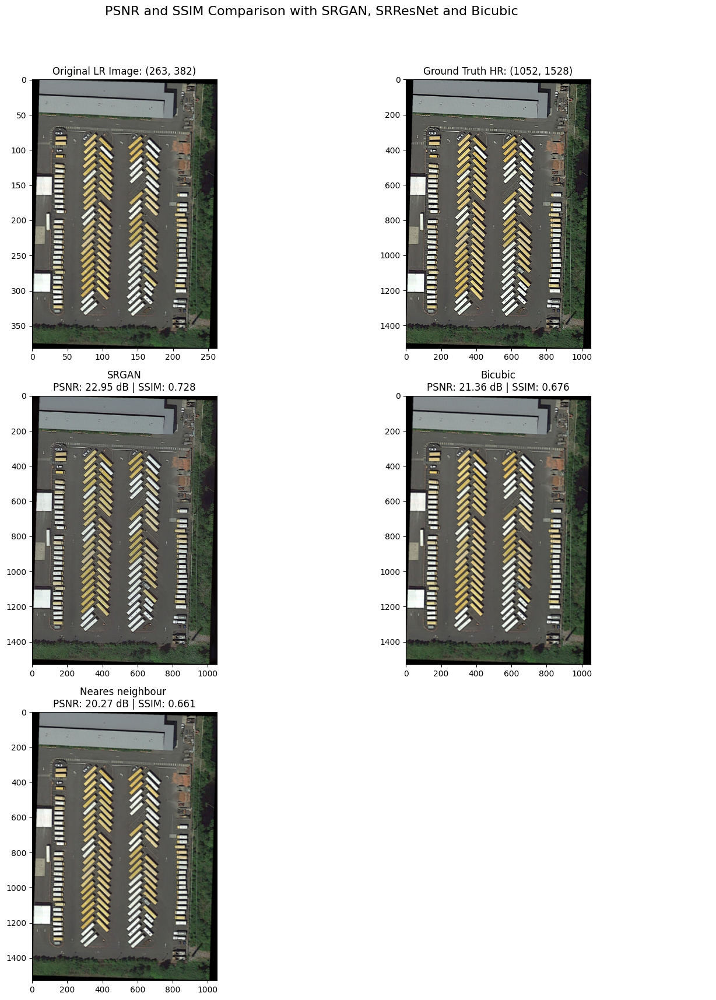

In [21]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images_large/P0006.png", halve=False)

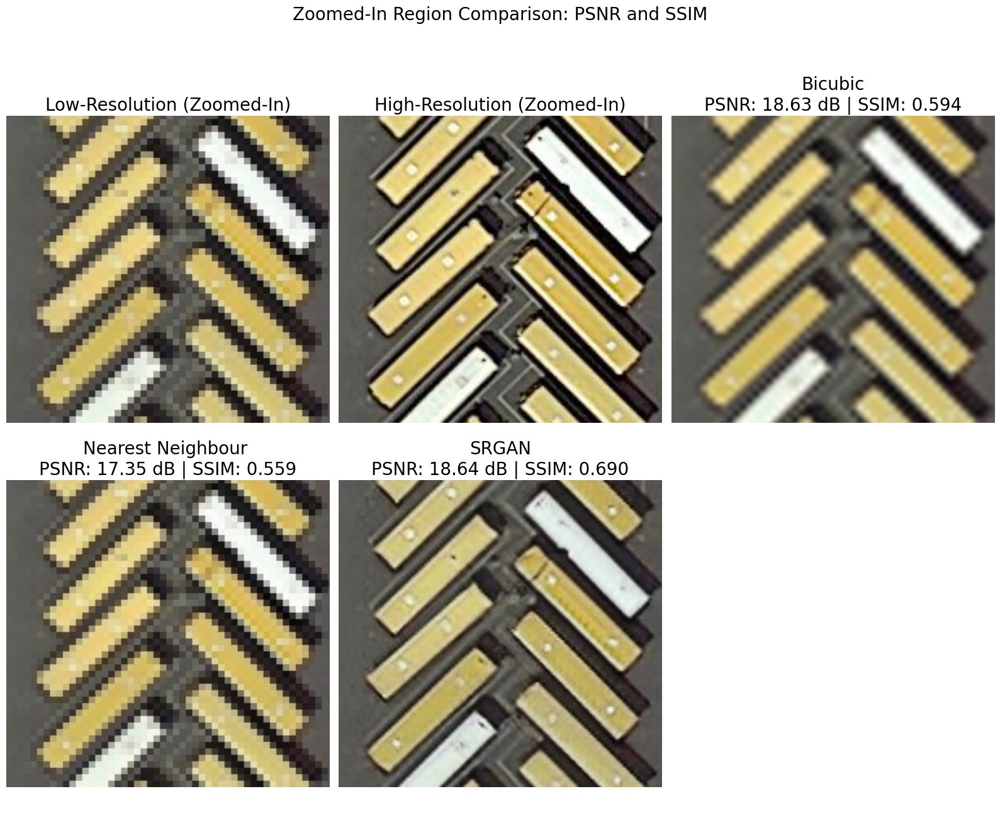

In [42]:
# Define the zoomed-in region (x, y, width, height)
zoomed_region = (270,370,200,190)

# Call the function to compare the zoomed-in region
compare_zoomed_region("dota/test/images_large/P0006.png", region=zoomed_region, halve=False)

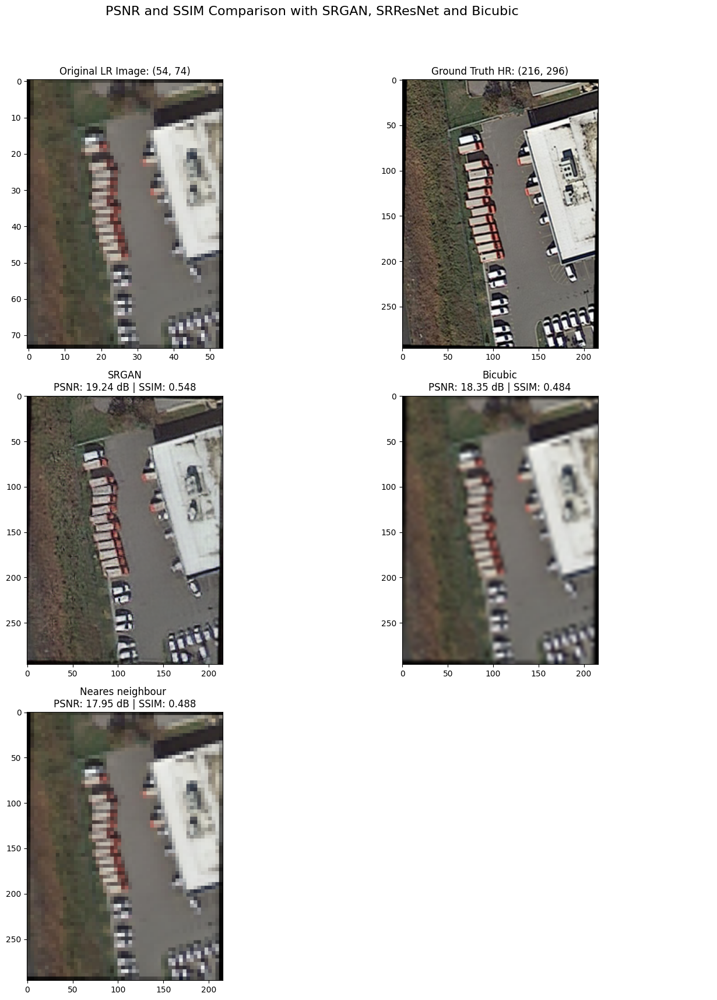

In [43]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images_large/P0318.png",halve=True)

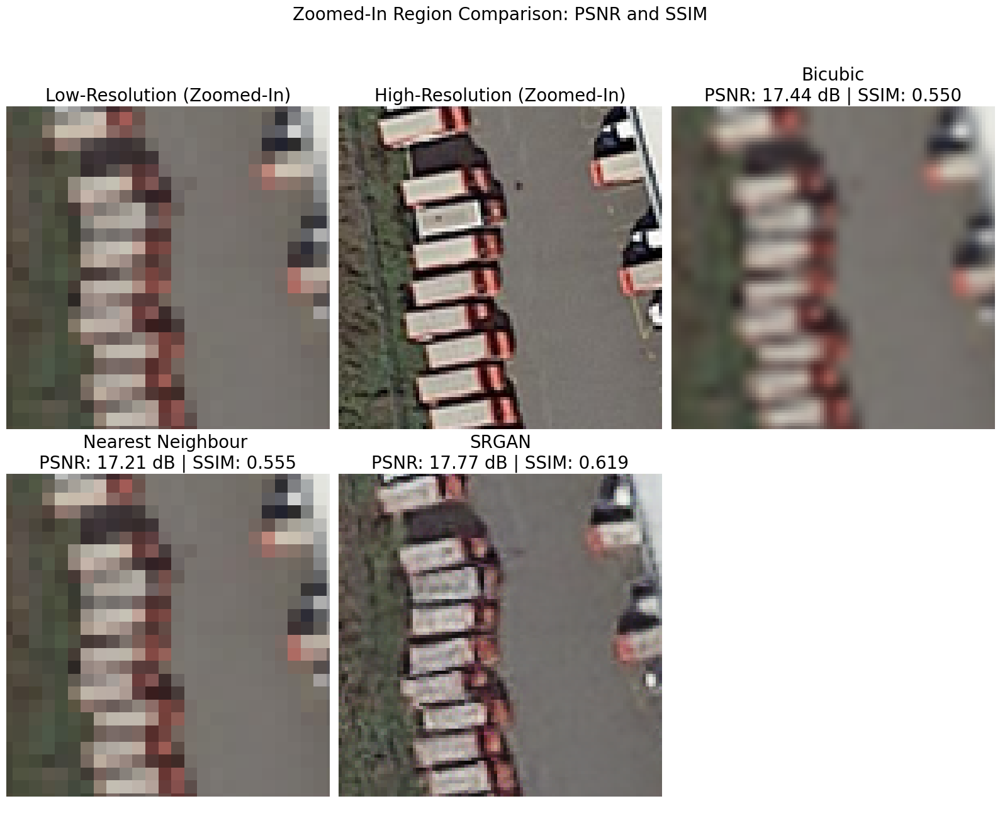

In [44]:
# Define the zoomed-in region (x, y, width, height)
zoomed_region = (50,70,100,100)

# Call the function to compare the zoomed-in region
compare_zoomed_region("dota/test/images_large/P0318.png", region=zoomed_region, halve=True)

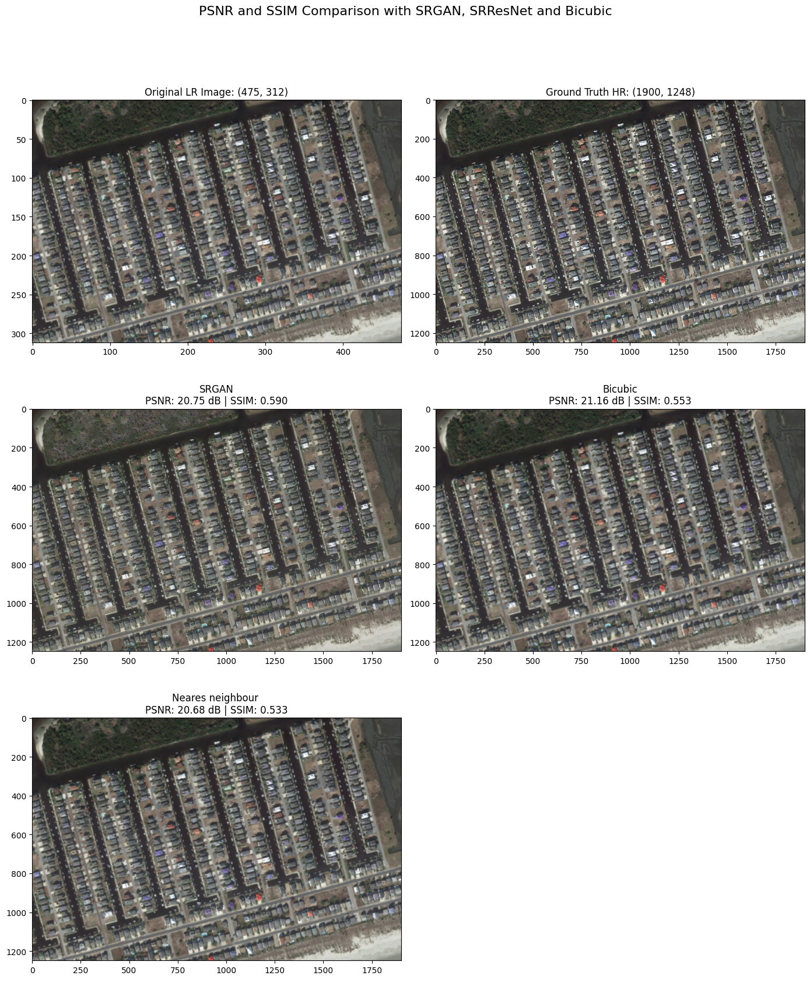

In [9]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images_large/P1018.png",halve=True)

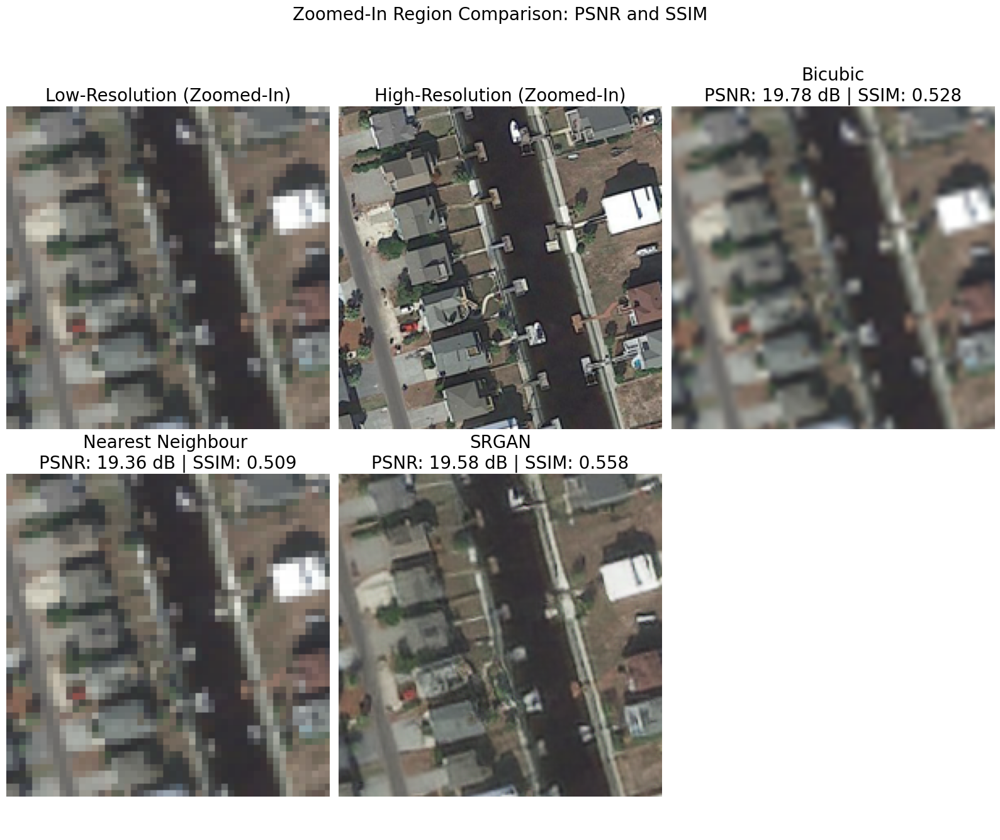

In [10]:
# Define the zoomed-in region (x, y, width, height)
zoomed_region = (300,800,200,200)

# Call the function to compare the zoomed-in region
compare_zoomed_region("dota/test/images_large/P1018.png", region=zoomed_region, halve=True)

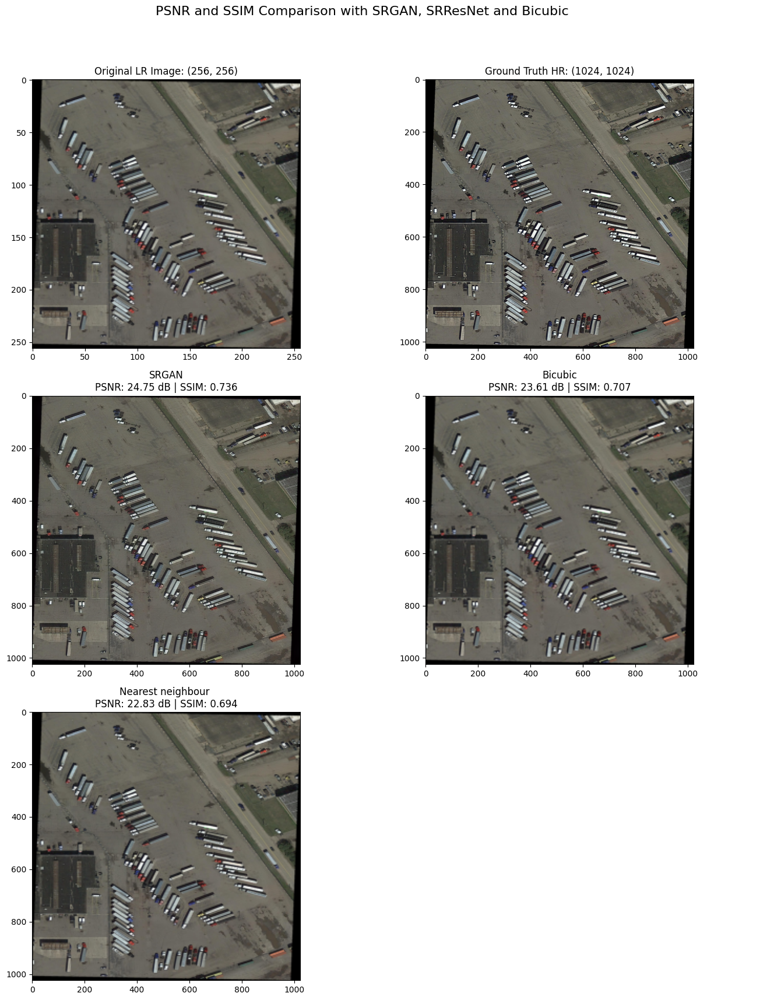

In [50]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images/P0009.png",halve=False)

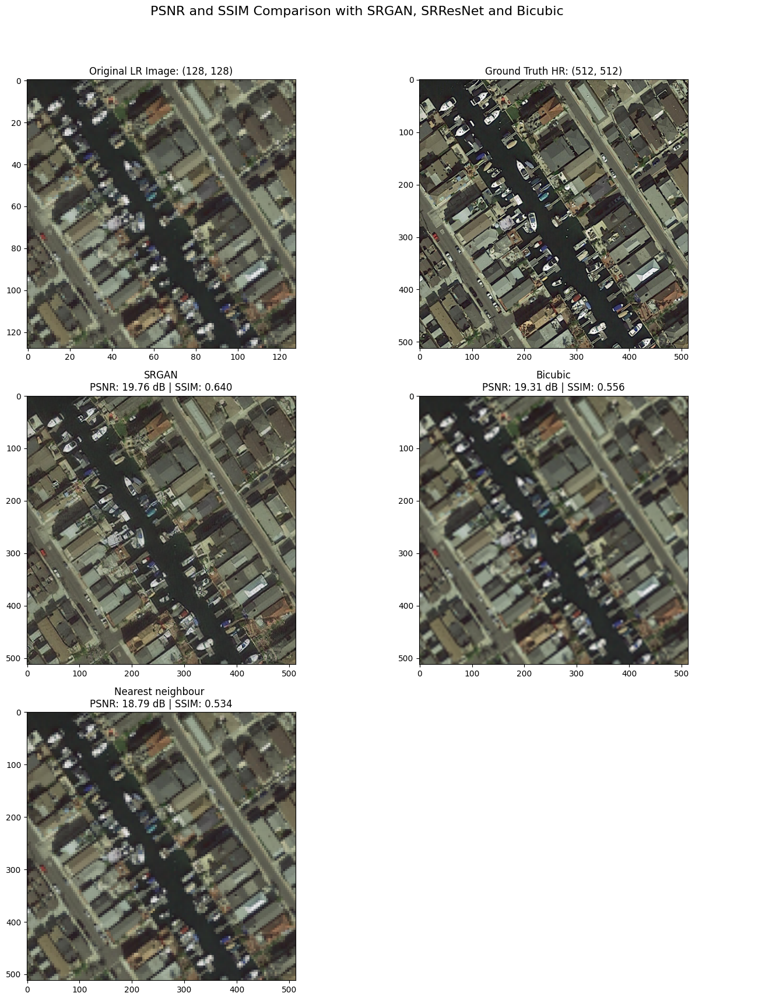

In [48]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images/P0765.png",halve=True)

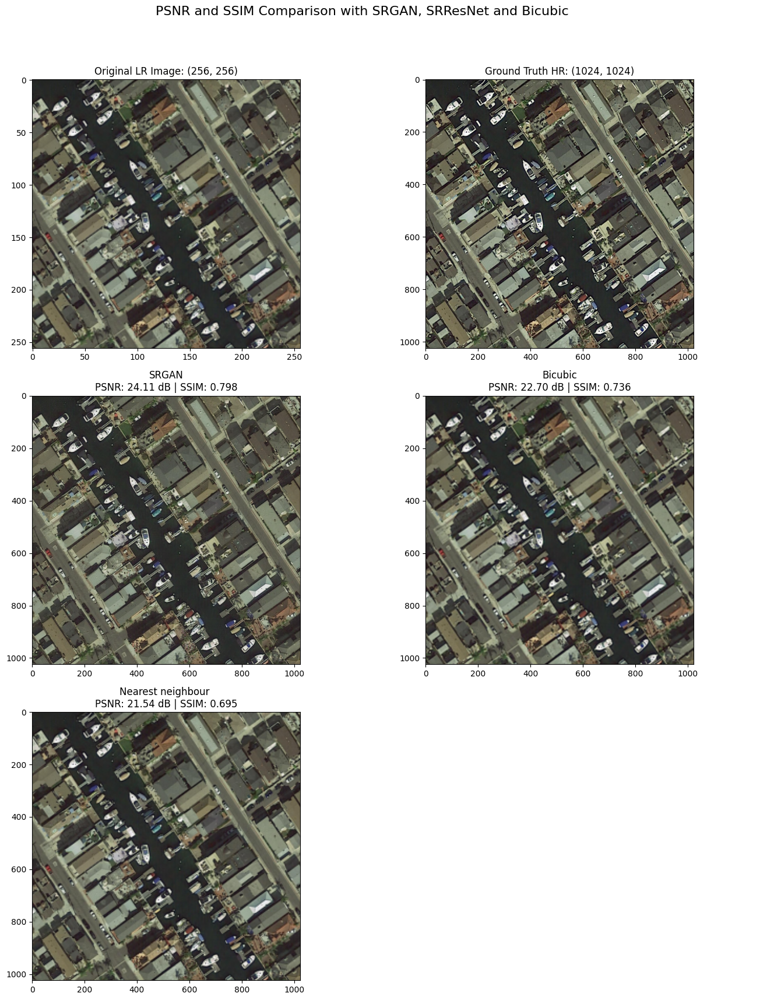

In [49]:
# Example usage
grid_img = visualize_sr_plot("dota/test/images/P0765.png",halve=False)

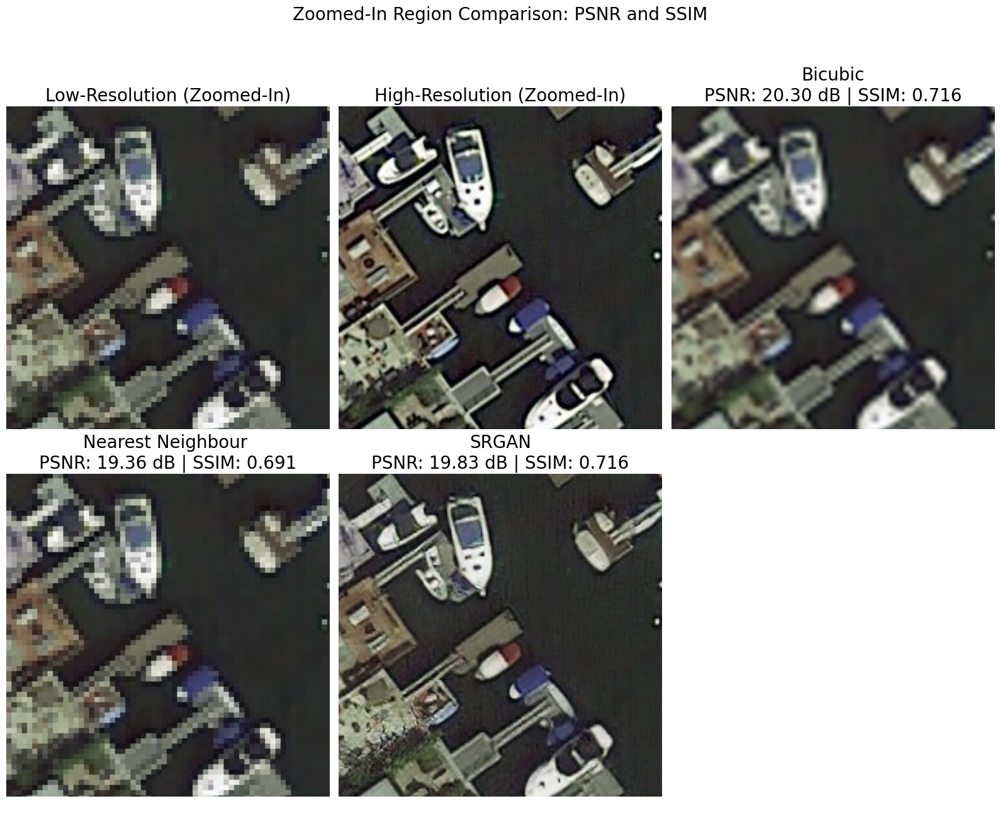

In [75]:
# Define the zoomed-in region (x, y, width, height)
zoomed_region = (380,520,250,250) #(630,800,200,200)#

# Call the function to compare the zoomed-in region
compare_zoomed_region("dota/test/images_large/P0765.png", region=zoomed_region, halve=False)